# Earrings Object Detection

In [ ]:
!pip install ultralytics==8.0.146

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.5/605.5 kB 10.6 MB/s eta 0:00:00


In [ ]:
import ultralytics  ##就是yoloV8
ultralytics.checks()

Ultralytics YOLOv8.0.146 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.9/78.2 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## 檢查是否有所需的檔案
!ls /content/drive/MyDrive/earrings_object_detection/Yolo/data

classes.txt		     earring_opencv.zip		    earring.yaml
earring_opencv_v1_error.zip  earring_original_v1_error.zip  test_photo


In [ ]:
# copy over the dataset into the root directory of the Colab VM

### 確認檔名ㄚㄚㄚ!
!cp /content/drive/MyDrive/earrings_object_detection/Yolo/data/earring_opencv.zip /content

In [ ]:
# unzip the dataset and the contents so that they are now in /content folder

### 確認檔名ㄚㄚㄚ!
!unzip /content/earring_opencv.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/earring_opencv/labels/train/sliver_hook109.txt  
  inflating: /content/earring_opencv/labels/train/21_blue_polygon220.txt  
  inflating: /content/earring_opencv/labels/train/sliver_hook110.txt  
  inflating: /content/earring_opencv/labels/train/21_blue_polygon221.txt  
  inflating: /content/earring_opencv/labels/train/sliver_hook111.txt  
  inflating: /content/earring_opencv/labels/train/21_blue_polygon222.txt  
  inflating: /content/earring_opencv/labels/train/sliver_hook113.txt  
  inflating: /content/earring_opencv/labels/train/21_blue_polygon224.txt  
  inflating: /content/earring_opencv/labels/train/sliver_hook114.txt  
  inflating: /content/earring_opencv/labels/train/21_blue_polygon225.txt  
  inflating: /content/earring_opencv/labels/train/sliver_hook118.txt  
  inflating: /content/earring_opencv/labels/train/21_blue_polygon226.txt  
  inflating: /content/earring_opencv/labels/train/sliver_hook121.txt  
  

# Train Model

In [ ]:
# https://docs.ultralytics.com/usage/cli/
# https://github.com/roboflow/notebooks/blob/main/notebooks/train-yolov8-object-detection-on-custom-dataset.ipynb

# data: yaml file to define path to data, classes' names
# model: yolov8x.pt yolov8l.pt yolov8m.pt yolov8s.pt yolov8n.pt
# a full list of train arguments: https://docs.ultralytics.com/usage/cfg/

## 模型訓練
!yolo task=detect \
mode=train \
model=yolov8s.pt \
data=/content/drive/MyDrive/earrings_object_detection/Yolo/data/earring.yaml \
batch=16 \
epochs=25 \
patience=5 \
imgsz=256 \
plots=True \
flipud=0.4 \
fliplr=0.4 \
mixup=0.7 \
copy_paste=0.7

100% 21.5M/21.5M [00:00<00:00, 251MB/s]
New https://pypi.org/project/ultralytics/8.0.215 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.146 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/earrings_object_detection/Yolo/data/earring.yaml, epochs=25, patience=5, batch=64, imgsz=256, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, l

# Evaluate Model

In [ ]:
## To save model weights to your google drive!
# best model weights(vertex of mAP50-95) v.s. last model weights(overfitting)

!cp '/content/runs/detect/train/weights/best.pt' '/content/drive/MyDrive/earrings_object_detection/Yolo/Training_records/#25_1122'
!cp '/content/runs/detect/train/weights/last.pt' '/content/drive/MyDrive/earrings_object_detection/Yolo/Training_records/#25_1122'

In [ ]:
# check training metrics:
# /content/runs/detect/train/results.png
# /content/runs/detect/train/confusion_matrix.png

In [ ]:
Image(filename='/content/runs/detect/train2/results.png', width=600)

!cp '/content/runs/detect/train/results.png' '/content/drive/MyDrive/earrings_object_detection/Yolo/Training_records/#25_1122'

In [ ]:
Image(filename='/content/runs/detect/train2/confusion_matrix.png', width=600)

!cp '/content/runs/detect/train/confusion_matrix.png' '/content/drive/MyDrive/earrings_object_detection/Yolo/Training_records/#25_1122'

##**Inference on test data**

In [ ]:
import os

# Specify the path for the new directory
new_directory_path = '/content/kaggle/input/earring-kaggle2-yaml'

# Create the directory
os.makedirs(new_directory_path, exist_ok=True)

w = "/content/drive/MyDrive/earrings_object_detection/Yolo/Training_records/#34_1127/best.pt"
!cp '/content/drive/MyDrive/earrings_object_detection/Yolo/kaggle/input/earring-kaggle2-yaml/earring_kaggle2.yaml' '/content/kaggle/input/earring-kaggle2-yaml'


# Current working directory
!pwd

# Change working directory
%cd /content/kaggle

# Verify the change
!pwd

!ls


# Load a model
model = YOLO(w)  # load a custom model


# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # a list contains map50-95 of each category

cp: cannot stat '/content/drive/MyDrive/earrings_object_detection/Yolo/kaggle/input/earring-kaggle2-yaml/earring_kaggle2.yaml': No such file or directory
/content/kaggle
/content/kaggle
/content/kaggle
input


Ultralytics YOLOv8.0.146 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25868131 parameters, 0 gradients


FileNotFoundError: ignored

In [ ]:
import os
from shutil import copyfile

# Specify the path for the new directory
new_directory_path = '/content/kaggle/input/earring-kaggle2-yaml'

# Create the directory
os.makedirs(new_directory_path, exist_ok=True)

# Copy the YAML file into the new directory
yaml_source_path = '/content/drive/MyDrive/earrings_object_detection/kaggle/earring_kaggle2.yaml'
yaml_destination_path = os.path.join(new_directory_path, 'earring_kaggle2.yaml')

# Check if the source file exists before copying
if os.path.exists(yaml_source_path):
    copyfile(yaml_source_path, yaml_destination_path)
else:
    print(f"Error: Source file '{yaml_source_path}' does not exist.")

# Check the contents of the new directory
!ls /content/kaggle/input/earring-kaggle2-yaml

# # Load a model
# w = "/content/drive/MyDrive/earrings_object_detection/Yolo/Training_records/#34_1127/best.pt"
# model = YOLO(w)  # load a custom model

# # Validate the model
# metrics = model.val()  # no arguments needed, dataset and settings remembered
# print("map50:", metrics.box.map50)  # map50
# print("map75:", metrics.box.map75)  # map75
# print("maps:", metrics.box.maps)    # a list contains map50-95 of each category


earring_kaggle2.yaml
/content


In [ ]:
## 載入模型與欲偵測的圖片或影片

# !yolo task=detect mode=predict model='/content/runs/detect/train2/weights/best.pt' conf=0.15 source=/content/drive/MyDrive/earrings_object_detection/Yolo/data/test_photo/girl.jpg save=True
!yolo task=detect mode=predict model='/content/drive/MyDrive/earrings_object_detection/Yolo/Training_records/#34_1127/best.pt' conf=0.15 source=/content/drive/MyDrive/earrings_object_detection/Yolo/data/test_photo/girl.jpg save=True

# 預設 conf=0.25, iou=0.7
##若模型的訓練結果不好，1.可以調conf/iou參數，調鬆一點，讓它偵測到，但也有可能不是物件的也被偵測到

2023-11-29 02:46:58.094438: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-29 02:46:58.094516: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-29 02:46:58.094559: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Ultralytics YOLOv8.0.146 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25868131 parameters, 0 gradients

image 1/1 /content/drive/MyDrive/earrings_object_detection/Yolo/data/test_photo/girl.jpg: 480x384 3 01_black_dot_pins, 2 37_girls, 1 38_small_polka_dot, 2 39_medium_black_rings, 3 40_small_black_rings, 127

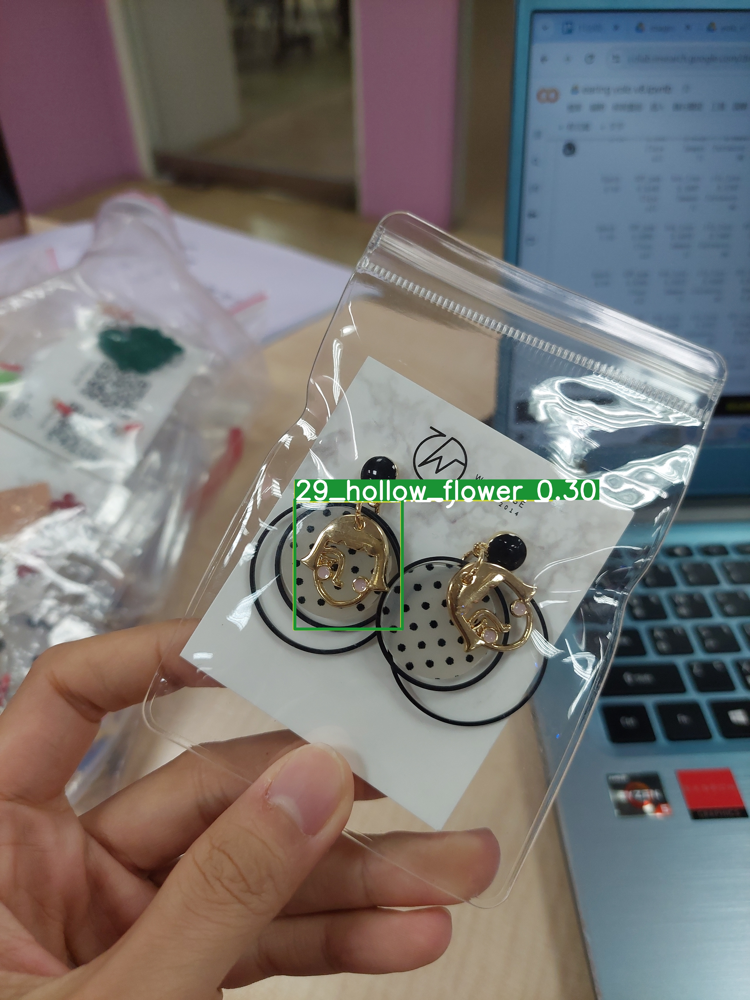

In [ ]:
## 圖示結果
display(Image(filename='/content/runs/detect/predict8/girl.jpg', width=400))

In [ ]:
# !yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt conf=0.25 source=/content/drive/MyDrive/earrings_object_detection/Yolo/data/test_photo/Rose.jpg save=True

!yolo task=detect mode=predict model='/content/drive/MyDrive/earrings_object_detection/Yolo/Training_records/#25_1122/best.pt' conf=0.15 source=/content/drive/MyDrive/earrings_object_detection/Yolo/data/test_photo/Rose.jpg save=True


2023-11-17 16:39:43.399272: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-17 16:39:43.399371: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-17 16:39:43.399427: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Ultralytics YOLOv8.0.146 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11144547 parameters, 0 gradients

image 1/1 /content/drive/MyDrive/2023project/earrings_object_detection/Yolo/data/Rose.jpg: 256x192 2 33_silver_roses, 1 34_big_polka_dot, 2 35_large_black_rings, 2 36_white_dot_pins, 67.8ms
Speed: 1.4ms pr

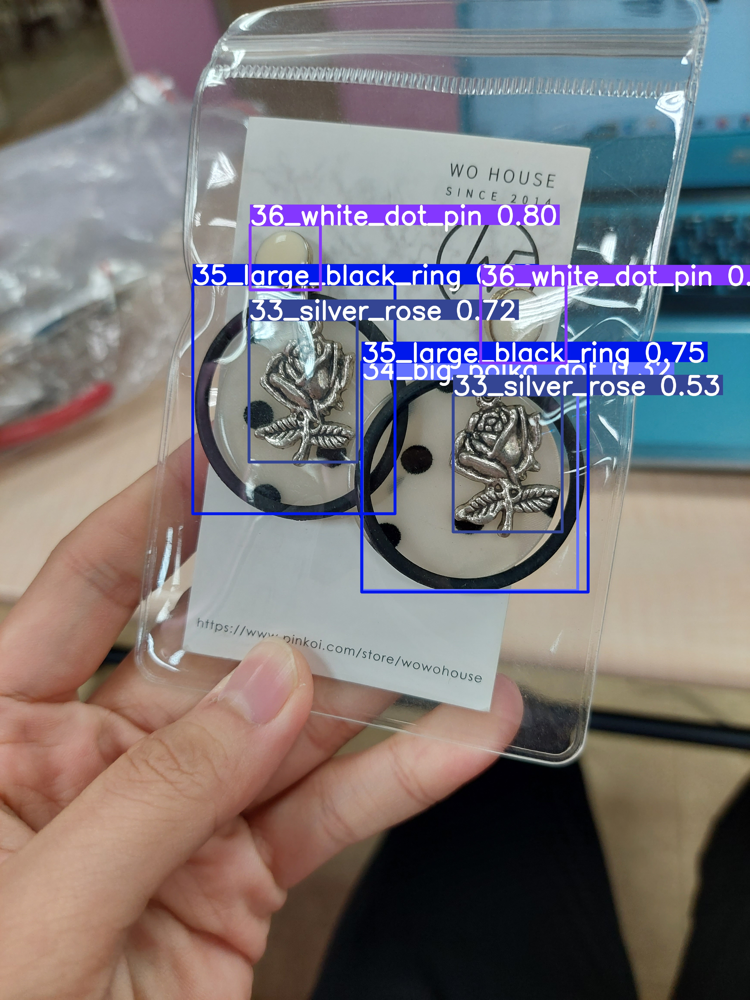

In [ ]:
display(Image(filename='/content/runs/detect/predict3/Rose.jpg', width=600))